"""
EEG PSD Script

Basic function for computing the power spectral density (PSD) of EEG data. This notebook allows users to analyze frequency components of EEG signals and visualize spectral properties.

Please check chdir in line 42 (import block line 24)

Authors: Marian Simarro gonzalez@cbs.mpg.de
Last Updated: March 2025
"""

# Import block

In [ ]:
# Load packages
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal, stats
from scipy.interpolate import interp1d
from datetime import datetime
import json

!pip install networkx
import networkx as nx

import pandas as pd
from sklearn.covariance import GraphicalLassoCV
from scipy.signal import find_peaks

!pip install nilearn
from nilearn import plotting

!pip install mne
import mne

os.chdir("C:/Users/Marianne/Downloads/Lemon/")  # Change to your actual folder where little_helpers.py and config.py files are
sys.path.append(os.getcwd())  # Ensure the current directory is added to the path

import config
from config import subjects_list, conditions, input_folder, psd_folder, output_folder

    fonttools (>=3.0<4.0) ; (python_version < "3") and extra == 'with-fonttools'
              ~~~~~~^

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


   ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
   ---------------------------------------- 1.6/1.6 MB 9.8 MB/s eta 0:00:00


c:\Python39\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
    fonttools (>=3.0<4.0) ; (python_version < "3") and extra == 'with-fonttools'
              ~~~~~~^

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


    fonttools (>=3.0<4.0) ; (python_version < "3") and extra == 'with-fonttools'
              ~~~~~~^

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


   ---------------------------------------- 0.0/7.0 MB ? eta -:--:--
   ------------- -------------------------- 2.4/7.0 MB 12.2 MB/s eta 0:00:01
   ----------------------------- ---------- 5.2/7.0 MB 12.7 MB/s eta 0:00:01
   ---------------------------------------- 7.0/7.0 MB 11.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/1.2 MB ? eta -:--:--
   ---------------------------------------- 1.2/1.2 MB 11.7 MB/s eta 0:00:00


    fonttools (>=3.0<4.0) ; (python_version < "3") and extra == 'with-fonttools'
              ~~~~~~^
ERROR: Could not install packages due to an OSError: [WinError 2] The system cannot find the file specified: 'c:\\python39\\Scripts\\nc3tonc4.exe' -> 'c:\\python39\\Scripts\\nc3tonc4.exe.deleteme'


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


ModuleNotFoundError: No module named 'mne_connectivity'

## Initiate lists

In [ ]:
# List to store PSDs for EO and EC conditions
eo_psd_list, ec_psd_list = [], []

# Initialize the reference shape (use the first subject's PSD for consistency)
reference_psd = None

Check subject data

In [ ]:
# List subjects to analyse 
# subjects = ["032304", "032305"]   # Set to all by default. Compleate "subjects_list" stored in config
# You can also analyse only one condition by changing the "conditions" parameter 
# e.g. conditions = "EC"

# Iterate through subject files
for subject in subjects:
    for condition in conditions:
        """ 
        This will load the EEG data for the subject or subjects selected and display:
        Sampling rate
        Number of channels
        Electrode positions
        """
        file_path = os.path.join(input_folder, f"{subject}_{condition}.set")
        
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue  # Skip to the next file if not found
        
        # Load EEG data
        data = mne.io.read_raw_eeglab(file_path, preload=True)

        # Print general info
        print(data.info)

        # Get data info
        sfreq = data.info['sfreq']
        ch_names = data.ch_names
        n_channels = len(ch_names)

        # Extract events
        events, event_id = mne.events_from_annotations(data)

        # Ensure event_id contains the key 2 before proceeding
        if 2 in event_id.values():
            epochs = mne.Epochs(data, events, event_id=2, tmin=-1, tmax=2, 
                                baseline=(-0.5, 0), preload=True, reject=dict(eeg=2e-4))
        else:
            print(f"Event ID 2 not found for {subject} {condition}. Skipping epochs creation.")
            
        spectrum = epochs.compute_psd(fmin=2, fmax=40., n_fft = 500, n_overlap = int(0.50 * 500), method = 'welch',  n_jobs=-1)
        mean_spectrum = spectrum.average()
        mean_spectrum.plot_topomap(cmap = 'RdBu_r')

Reading /data/tu_gonzalez/MPI-Leipzig-Mind-Brain-Body/subjects/sub-032304/ses-01/sub-032305_EC.fdt
Reading 0 ... 116011  =      0.000 ...   464.044 secs...


/tmp/ipykernel_7410/3537750197.py:9: RuntimeWarning: Data file name in EEG.data (sub-010006_EC.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032305_EC.fdt).
  data = mne.io.read_raw_eeglab(eeg_file, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, C3, Cz, C4, ...
 chs: 60 EEG
 custom_ref_applied: False
 dig: 63 items (3 Cardinal, 60 EEG)
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: unspecified
 nchan: 60
 projs: []
 sfreq: 250.0 Hz
>
Used Annotations descriptions: [np.str_('32766'), np.str_('4'), np.str_('5'), np.str_('boundary')]
Used Annotations descriptions: [np.str_('32766'), np.str_('4'), np.str_('5'), np.str_('boundary')]
Not setting metadata
231 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 231 events and 751 original time points ...


/tmp/ipykernel_7410/3537750197.py:9: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(eeg_file, preload=True)
/tmp/ipykernel_7410/3537750197.py:9: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(eeg_file, preload=True)


2 bad epochs dropped


# Grand average power


Power spectrum depicts the grand average power spectra across participants and channels for eyes open and eyes closed conditions. Shaded areas indicate the standard deviation of the power spectra across participants. Black bars over the x axis indicate frequency intervals of significant clusters between conditions (dependent samples cluster-based permutation test). Note that in the TDBRAIN dataset, line noise could not be completely removed due to high levels of noise in some recordings. EC = Eyes Closed. EO = Eyes Open.

In [ ]:
# Initialize lists to store PSDs and their corresponding frequencies for each condition
eo_data = []  # Will store tuples of (psd_data, freqs) for EO condition
ec_data = []  # Will store tuples of (psd_data, freqs) for EC condition

# Iterate through subject files
for subject in subjects:
    for condition in conditions:
        """
        Load Data and Compute PSD:
        For each subject and condition (EO/EC), load the EEG data
        and compute the Power Spectral Density (PSD) using Welch's method.
        Ensure consistent parameters (e.g., fmax=100)
        to maintain frequency resolution.
        """
        file_path = os.path.join(input_folder, f"{subject}_{condition}.set")
        print("XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX")
        print("Starting subjects" f"{subject}_{condition}.set")

        try:
            # Load EEG data
            data = mne.io.read_raw_eeglab(file_path, preload=True)

            # Get data info
            sfreq = data.info['sfreq']
            ch_names = data.ch_names
            n_channels = len(ch_names) 
        
            # Compute Power Spectral Density (PSD)
            psd = data.compute_psd(fmax=100, picks="data", exclude="bads")
            #plot it
            data.compute_psd(fmax=100).plot(picks="data", exclude="bads", amplitude=False) # alpha, beta, etc

            #spectrum = data.compute_psd(fmax=100)
            #spectrum.plot(average=True, picks="data", exclude="bads", amplitude=False)

            # Extract PSD data and frequencies
            psd_data = psd.get_data()  # Shape: (channels, frequencies)
            freqs = psd.freqs

            # Store PSD data and frequencies for each condition
            if condition == 'EC':
                ec_data.append((psd_data.copy(), freqs.copy(), ch_names))
                print(f"EC {subject} shape: {psd_data.shape}, freqs: {len(freqs)}")
            elif condition == 'EO':
                eo_data.append((psd_data.copy(), freqs.copy(), ch_names))
                print(f"EO {subject} shape: {psd_data.shape}, freqs: {len(freqs)}")
            
            # Save individual subject PSD
            psd_filepath = os.path.join(psd_folder, f"{subject}_{condition}_psd.npy")
            np.save(psd_filepath, psd_data)
            np.save(psd_filepath, freqs)

        except Exception as e:
            print(f"Error processing {subject} - {condition}: {str(e)}")
        
        # Extract events
        events, event_id = mne.events_from_annotations(data)

        # Ensure event_id contains the key 2 before proceeding
        if 2 in event_id.values():
            epochs = mne.Epochs(data, events, event_id=2, tmin=-1, tmax=2, 
                                baseline=(-0.5, 0), preload=True, reject=dict(eeg=2e-4))
        else:
            print(f"Event ID 2 not found for {subject} {condition}. Skipping epochs creation.")
        
        #Plot topo maps and save   
        spectrum = epochs.compute_psd(fmin=2, fmax=40., n_fft = 500, n_overlap = int(0.50 * 500), method = 'welch',  n_jobs=-1)
        mean_spectrum = spectrum.average()
        mean_spectrum.plot_topomap(cmap = 'RdBu_r')
        plt.savefig(os.path.join(psd_folder, 'mean_spectrum.png'), dpi=300)
        np.save(os.path.join(psd_folder, f"{subject}_{condition}_topomap"), mean_spectrum)

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032304_EO.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032304_EO.fdt
Reading 0 ... 119821  =      0.000 ...   479.284 secs...


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010005_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032304_EO.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EO sub-032304 shape: (61, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032304_EC.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032304_EC.fdt
Reading 0 ... 119999  =      0.000 ...   479.996 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010005_EC.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032304_EC.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EC sub-032304 shape: (61, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032305_EO.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032305_EO.fdt
Reading 0 ... 110270  =      0.000 ...   441.080 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010006_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032305_EO.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EO sub-032305 shape: (61, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032305_EC.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032305_EC.fdt
Reading 0 ... 116011  =      0.000 ...   464.044 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010006_EC.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032305_EC.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EC sub-032305 shape: (60, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032306_EO.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032306_EO.fdt
Reading 0 ... 119035  =      0.000 ...   476.140 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010007_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032306_EO.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EO sub-032306 shape: (57, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032306_EC.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032306_EC.fdt
Reading 0 ... 119979  =      0.000 ...   479.916 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010007_EC.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032306_EC.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EC sub-032306 shape: (57, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032307_EO.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032307_EO.fdt
Reading 0 ... 114916  =      0.000 ...   459.664 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010010_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032307_EO.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EO sub-032307 shape: (59, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032307_EC.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032307_EC.fdt
Reading 0 ... 119042  =      0.000 ...   476.168 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010010_EC.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032307_EC.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EC sub-032307 shape: (59, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032308_EO.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032308_EO.fdt
Reading 0 ... 118402  =      0.000 ...   473.608 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010012_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032308_EO.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EO sub-032308 shape: (61, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032308_EC.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032308_EC.fdt
Reading 0 ... 119999  =      0.000 ...   479.996 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010012_EC.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032308_EC.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EC sub-032308 shape: (61, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032310_EO.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032310_EO.fdt
Reading 0 ... 119478  =      0.000 ...   477.912 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010016_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032310_EO.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EO sub-032310 shape: (59, 820), freqs: 820
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Starting subjectssub-032310_EC.set
Reading C:\Users\Marianne\Downloads\Lemon\subjects\ses-01\sub-032310_EC.fdt
Reading 0 ... 119042  =      0.000 ...   476.168 secs...


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Data file name in EEG.data (sub-010016_EC.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-032310_EC.fdt).
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)


C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\Marianne\AppData\Local\Temp\ipykernel_14264\3933943473.py:23: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  data = mne.io.read_raw_eeglab(file_path, preload=True)


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
EC sub-032310 shape: (59, 820), freqs: 820


c:\Python39\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


In [ ]:
# Check if we have data to process
if len(eo_data) > 0 and len(ec_data) > 0:
    # Modified function to align channels across subjects
    def normalize_psds(data_list):
        """
        Channel Alignment:
        Collects channel names from all subjects (ch_names must be included in data_list)
        Finds the intersection of channels present in all subjects
        Selects channels by name/index rather than truncating randomly
        
        When appending to data_list, include channel names
        eo_data.append((subject_psd, subject_freqs, subject_ch_names))
        ec_data.append((subject_psd, subject_freqs, subject_ch_names))
        """
        
        # First collect ALL channel names from all subjects
        all_channel_sets = [set(ch_names) for _, _, ch_names in data_list]
        common_channels = sorted(list(set.intersection(*all_channel_sets)))

        # Get common frequency grid (0-100 Hz with 257 points)
        common_freqs = np.linspace(0, 100, 257)

        normalized_psds = []

        for psd, freqs, ch_names in data_list:
            # Find indices of common channels in THIS subject's data
            channel_indices = [ch_names.index(ch) for ch in common_channels]
            
            # Select ONLY common channels (in consistent order)
            psd_common = psd[channel_indices, :]

            # Resample to common frequency grid
            resampled_psd = np.zeros((len(common_channels), len(common_freqs)))
            for i, chan_psd in enumerate(psd_common):
                f = interp1d(freqs, chan_psd, bounds_error=False, fill_value="extrapolate")
                resampled_psd[i, :] = f(common_freqs)

            normalized_psds.append(resampled_psd)

        return normalized_psds, common_freqs, common_channels

    # Normalize PSDs for each condition
    print("Normalizing EO PSDs...")
    eo_normalized, eo_common_freqs, common_channels = normalize_psds(eo_data)
    print("Normalizing EC PSDs...")
    ec_normalized, ec_common_freqs, _ = normalize_psds(ec_data)  # Channels already aligned
    print(len(data.ch_names))

    # Convert to numpy arrays
    eo_psd_array = np.array(eo_normalized)  # Shape: (subjects, channels, frequencies)
    ec_psd_array = np.array(ec_normalized)

    print(f"Final arrays - EO: {eo_psd_array.shape}, EC: {ec_psd_array.shape}")
    print(f"Common channels ({len(common_channels)}): {common_channels}")

    # Define the output directory for PSDs
    psd_folder = "C:/Users/Marianne/Downloads/Lemon/subjects/Results/psd"

    # Save array PSD
    np.save(os.path.join(psd_folder,f"EO_psd_normalized.npy"), eo_psd_array)
    np.save(os.path.join(psd_folder,f"EC_psd_normalized.npy"), ec_psd_array)    
    print("Analysis complete. Results saved to output folder.")
else:
    print("No data was processed. Check input files and paths.")  

Normalizing EO PSDs...
Normalizing EC PSDs...
59
Final arrays - EO: (6, 55, 257), EC: (6, 56, 257)
Common channels (55): ['AF3', 'AF4', 'AF7', 'AF8', 'AFz', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'CP1', 'CP2', 'CP3', 'CP4', 'CP5', 'CP6', 'CPz', 'Cz', 'F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F8', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'FT7', 'FT8', 'Fp1', 'Fp2', 'Fz', 'O2', 'Oz', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'PO10', 'PO3', 'PO4', 'PO7', 'PO8', 'POz', 'Pz', 'TP7', 'TP8']
Analysis complete. Results saved to output folder.


## Average Across Channels per Subject:
    For each subject, average the PSD across all channels to obtain
    a single spectrum per subject.
    Then compute the grand mean and standard deviation across subjects.
    This ensures the standard deviation reflects inter-participant variability.

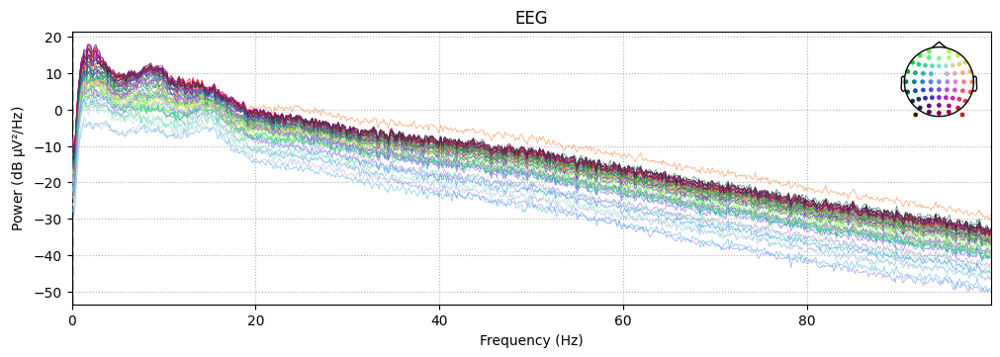

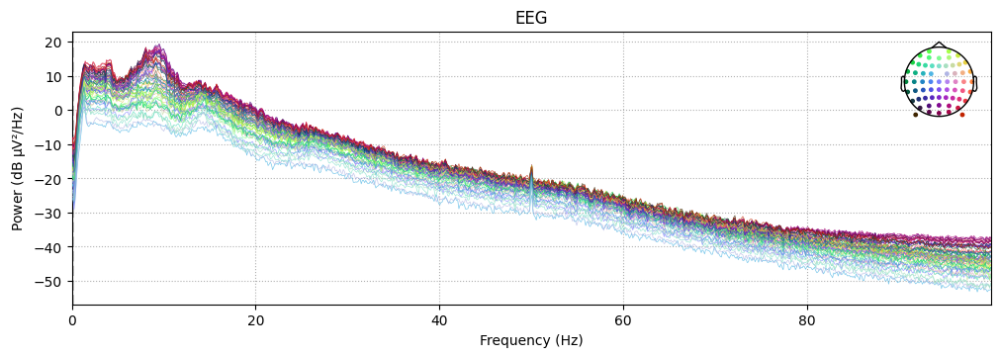

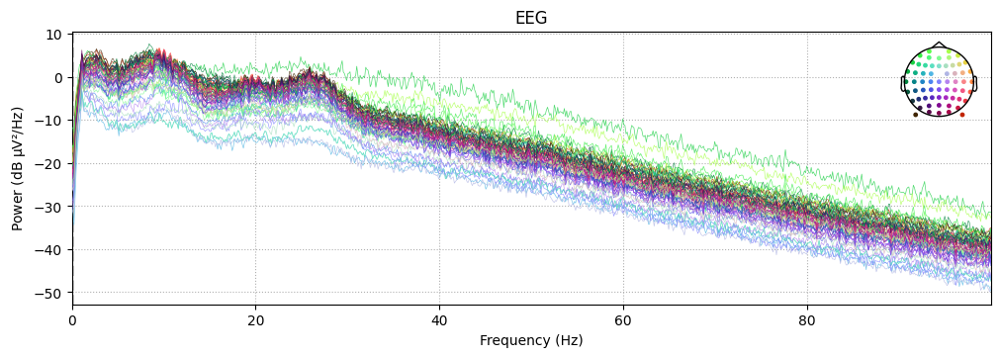

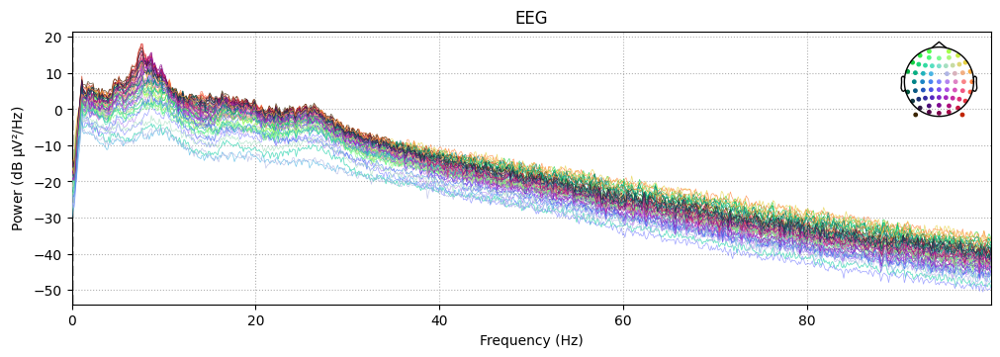

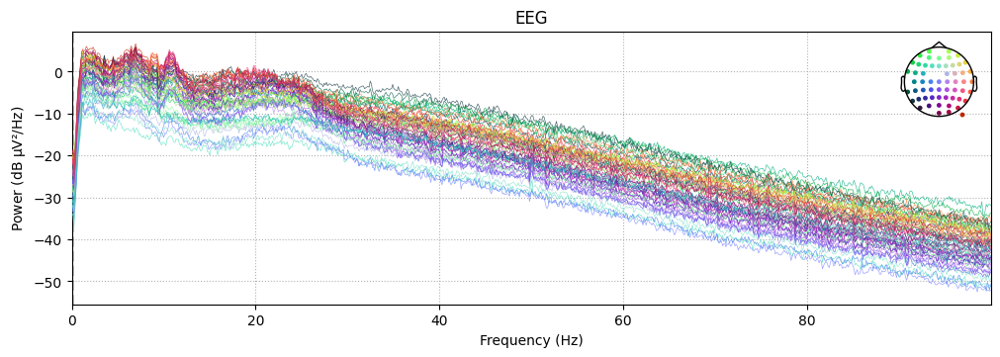

...

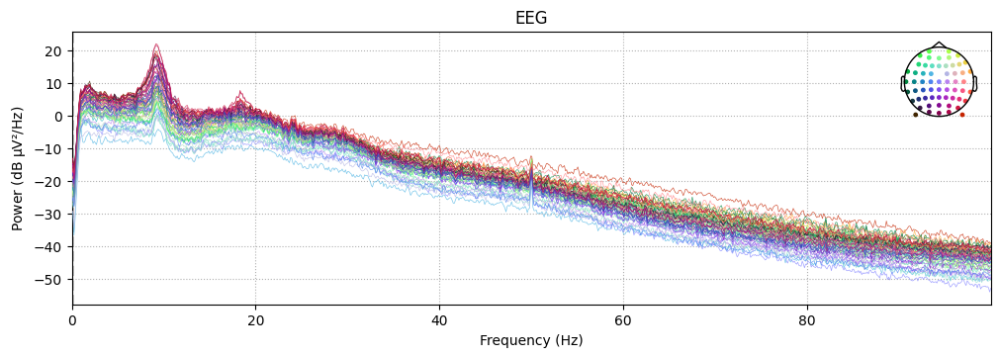

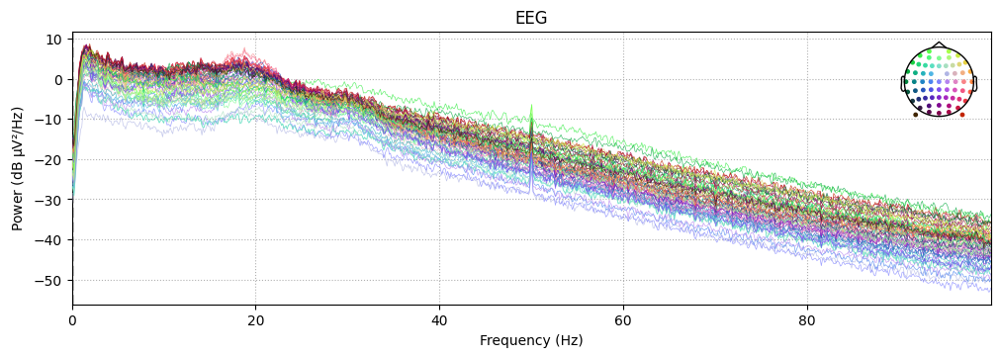

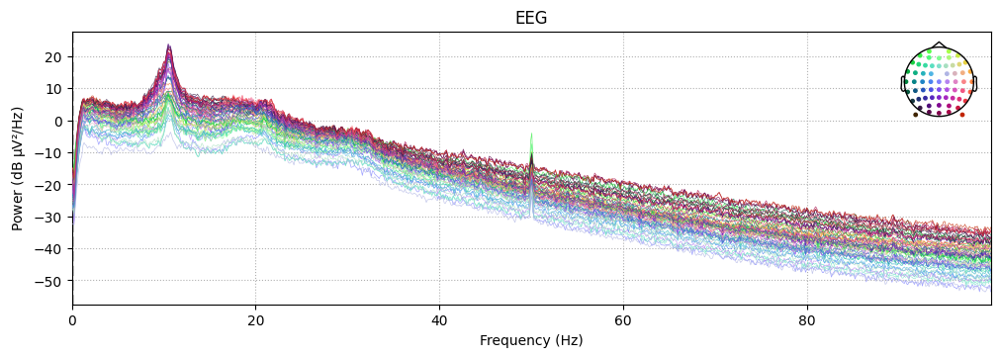

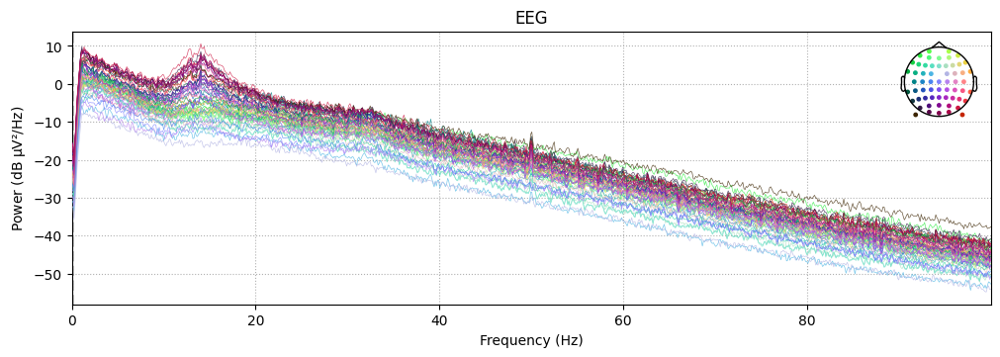

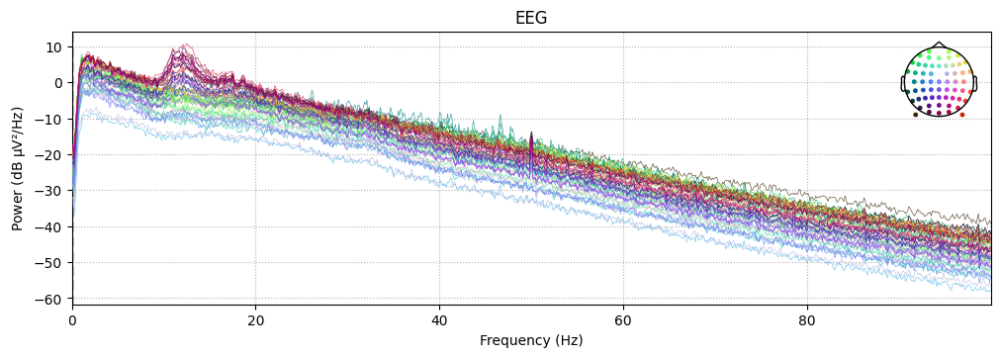

<Figure size 1200x600 with 0 Axes>

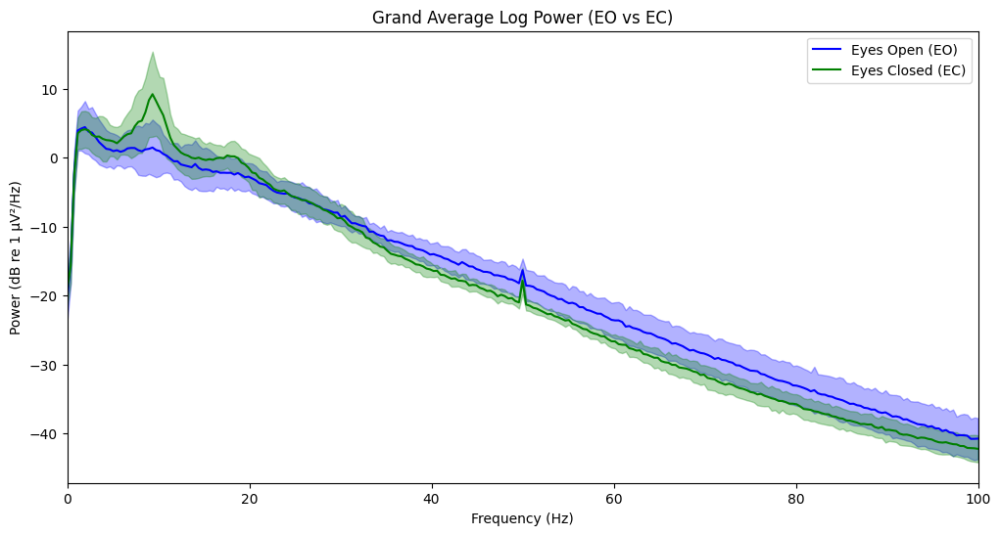

In [ ]:
# After normalization and creating eo_psd_array and ec_psd_array:

# CONVERT TO MICROVOLTS SQUARED (if data is in V²/Hz)
eo_psd_array_micro = eo_psd_array * 1e12  # 1 V²/Hz = 1e12 µV²/Hz
ec_psd_array_micro = ec_psd_array * 1e12

# Average across channels for each subject and condition to get (subjects, frequencies)
"""
In the normalization step, eo_psd_array is (subjects, channels, frequencies).
To get a per-subject average across channels,
we should take the mean over axis=1 (channels) for each subject.
The result is (subjects, frequencies).
"""
eo_subject_avg = np.mean(eo_psd_array_micro, axis=1)
ec_subject_avg = np.mean(ec_psd_array_micro, axis=1)


# Save the mean and std results
np.save(os.path.join(psd_folder, "EO_subject_avg"), eo_subject_avg)
np.save(os.path.join(psd_folder, "EC_subject_avg"), ec_subject_avg)

# Compute log10 power (use 10*log10 for dB scaling)
# of each subject's data
# (ensure no zero/negative values in eo_psd_array/ec_psd_array)
eo_subject_log = 10 * np.log10(eo_subject_avg)  # Now in dB
ec_subject_log = 10 * np.log10(ec_subject_avg)

# Compute grand mean and std across subjects in log domain in dB
"""Compute Grand Average and Standard Deviation:
   Calculate the mean and standard deviation across
   all subjects' averaged spectra for each condition.
   The grand average is the mean over subjects (axis=0),
   resulting in (frequencies,), and the std is also over subjects (axis=0),
   resulting in (frequencies,).
   """
eo_grand_mean = np.mean(eo_subject_log, axis=0)
eo_grand_std = np.std(eo_subject_log, axis=0)
ec_grand_mean = np.mean(ec_subject_log, axis=0)
ec_grand_std = np.std(ec_subject_log, axis=0)

# Save the mean and std results
np.save(os.path.join(psd_folder, "EO_grand_mean_psd"), eo_grand_mean)
np.save(os.path.join(psd_folder, "EO_grand_std_psd"), eo_grand_std)
np.save(os.path.join(psd_folder, "EC_grand_mean_psd"), ec_grand_mean)
np.save(os.path.join(psd_folder, "EC_grand_std_psd"), ec_grand_std)

# Plotting
"""
Plot with Shaded Standard Deviation:
plot the log grand average power spectra across participants and channels
for eyes open (EO) and eyes closed (EC) conditions,
with shaded areas indicating the standard deviation across participants.
"""

plt.figure(figsize=(12, 6))

# Function to handle zero std by masking with NaN
def mask_zero_std(mean, std):
    upper = mean + std
    lower = mean - std
    mask = std == 0
    upper[mask] = np.nan
    lower[mask] = np.nan
    return upper, lower

# EO condition
plt.plot(eo_common_freqs, eo_grand_mean, 'b-', label='Eyes Open (EO)')
eo_upper, eo_lower = mask_zero_std(eo_grand_mean, eo_grand_std)
plt.fill_between(eo_common_freqs, eo_lower, eo_upper, color='b', alpha=0.3)

# EC condition
plt.plot(ec_common_freqs, ec_grand_mean, 'g-', label='Eyes Closed (EC)')
ec_upper, ec_lower = mask_zero_std(ec_grand_mean, ec_grand_std)
plt.fill_between(ec_common_freqs, ec_lower, ec_upper, color='g', alpha=0.3)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (dB re 1 µV²/Hz)')  # Update label to dB
plt.title('Grand Average Log Power (EO vs EC)')
plt.legend()
plt.grid(False)
plt.xlim(0, 100)
plt.show()

# Save the figure
plt.savefig(os.path.join(psd_folder, 'average_psd_by_condition.png'), dpi=300)
